TVDR-TDWS Implementation with NILMTK Integration
Appliance: kettle
Sampling Rate: 16.0kHz
Voltage: 325V peak (229.8V RMS)
Window Size: 8 cycles (160ms)

Loading dataset...
Detecting activation events...
Error loading data: 'Index' object has no attribute 'abs'
Falling back to simulated data...
Using simulated data...
Generating simulated data...
Generated 160000 samples of simulated data

Generating overview of all detected events...


c:\Users\Raymond Tie\Desktop\NILM\.venv\Lib\site-packages\nilmtk\utils.py:501: FutureWarning: 'S' is deprecated and will be removed in a future version, please use 's' instead.
  return fill_method(how(data.resample(rule, **resample_kwargs)))
c:\Users\Raymond Tie\Desktop\NILM\.venv\Lib\site-packages\nilmtk\utils.py:501: FutureWarning: 'S' is deprecated and will be removed in a future version, please use 's' instead.
  return fill_method(how(data.resample(rule, **resample_kwargs)))


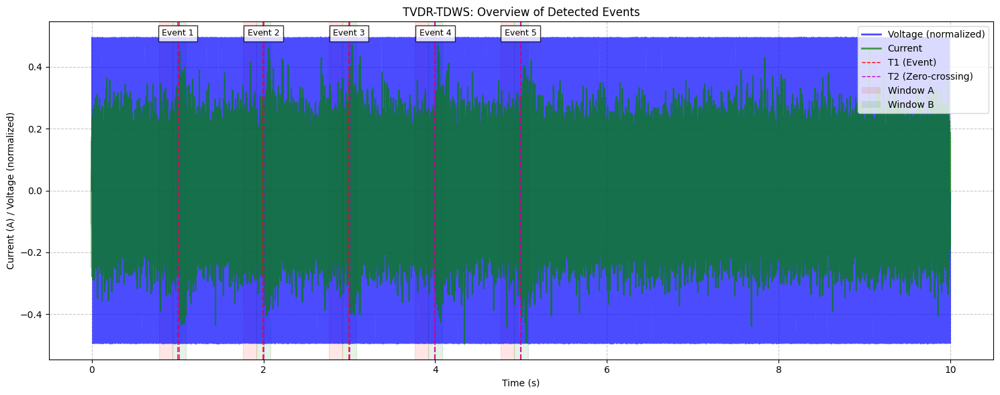


Processing 5 events...


Processing events:   0%|          | 0/5 [00:00<?, ?it/s]


Plotting event 1...


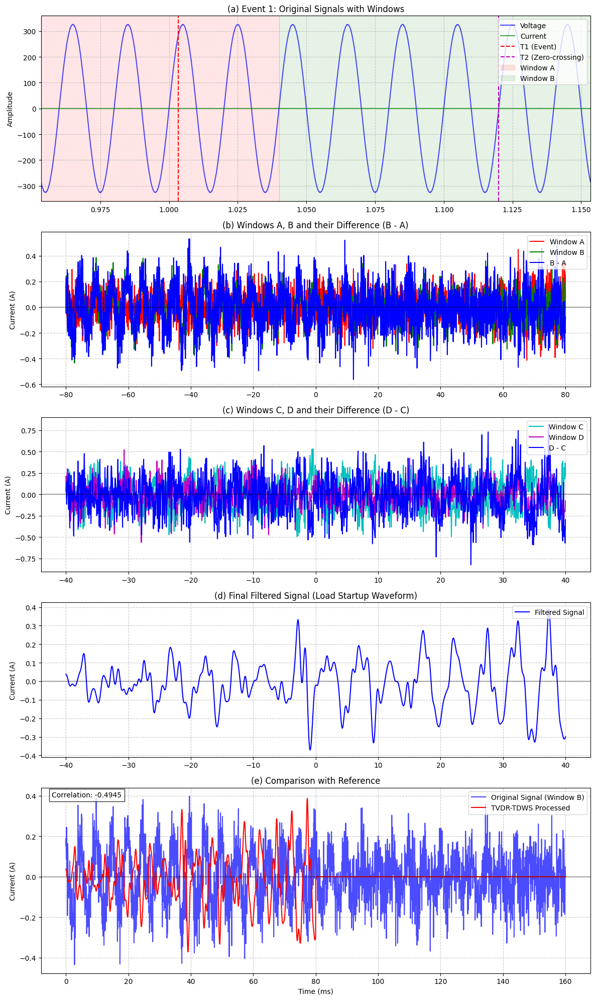

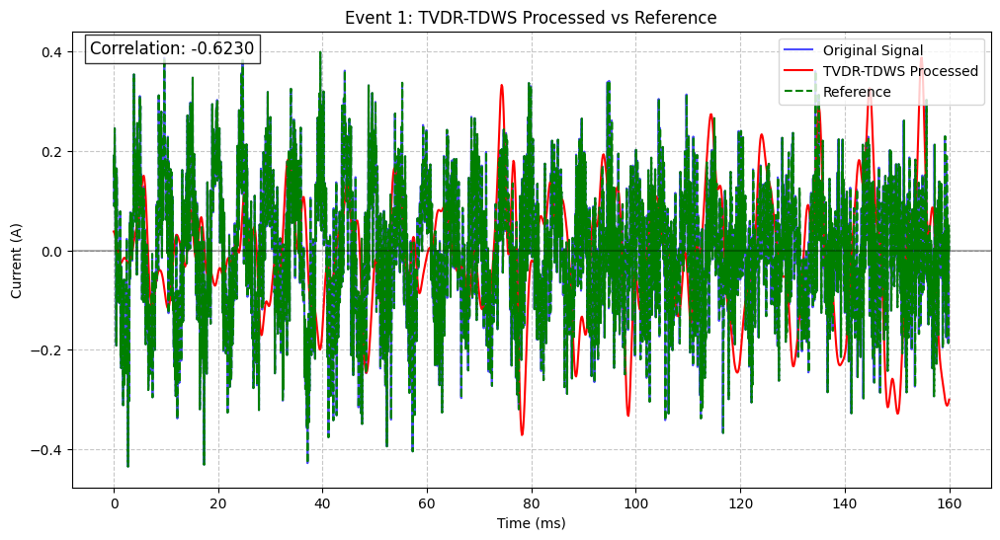

Processing events:  20%|██        | 1/5 [00:06<00:26,  6.60s/it]


Plotting event 2...


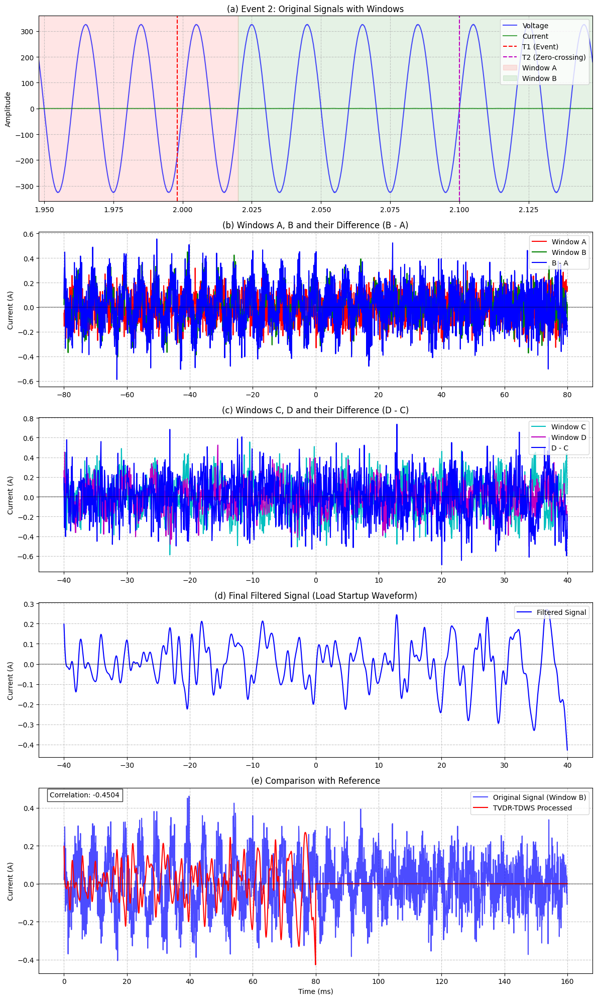

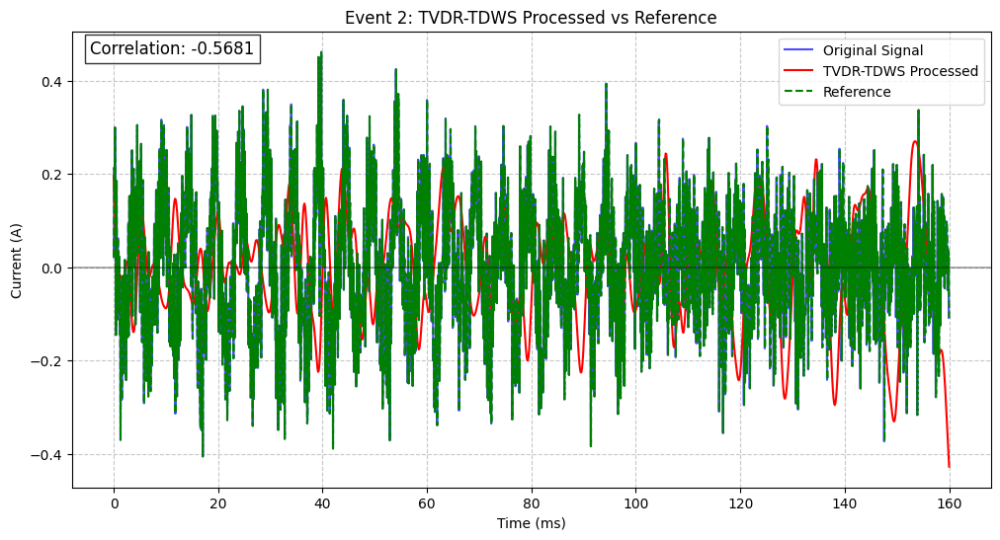

Processing events:  40%|████      | 2/5 [00:22<00:35, 11.82s/it]


Plotting event 3...


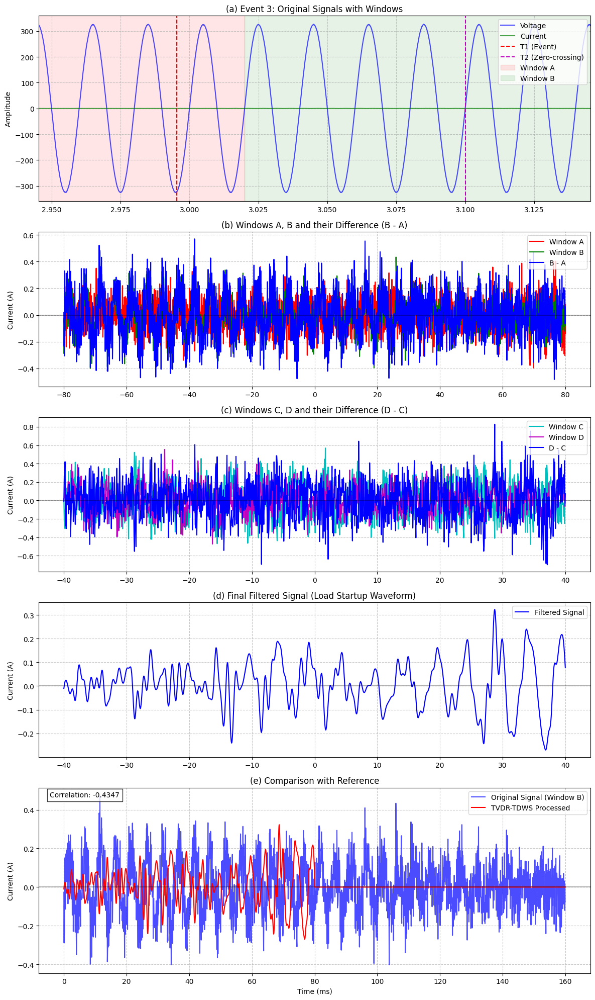

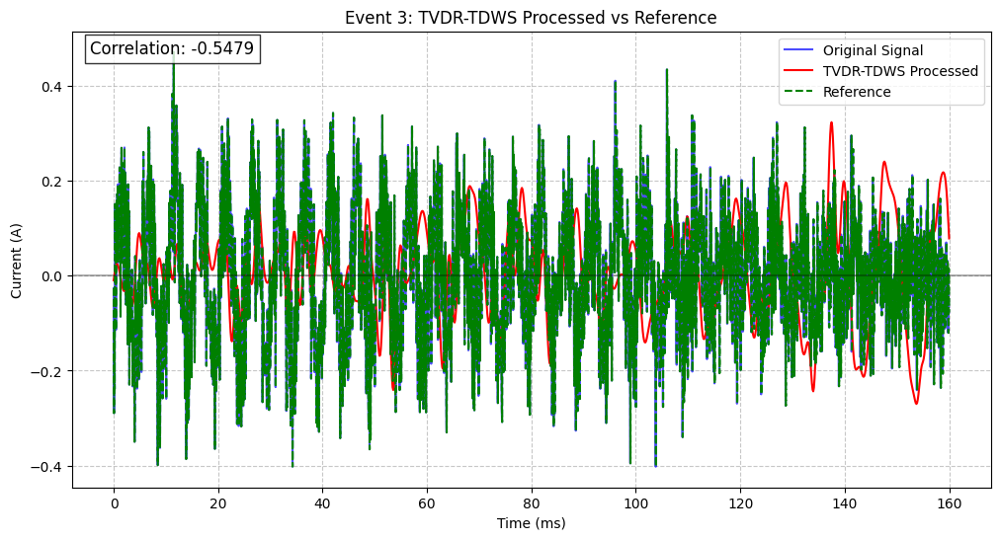

Processing events:  60%|██████    | 3/5 [00:43<00:32, 16.05s/it]


Plotting event 4...


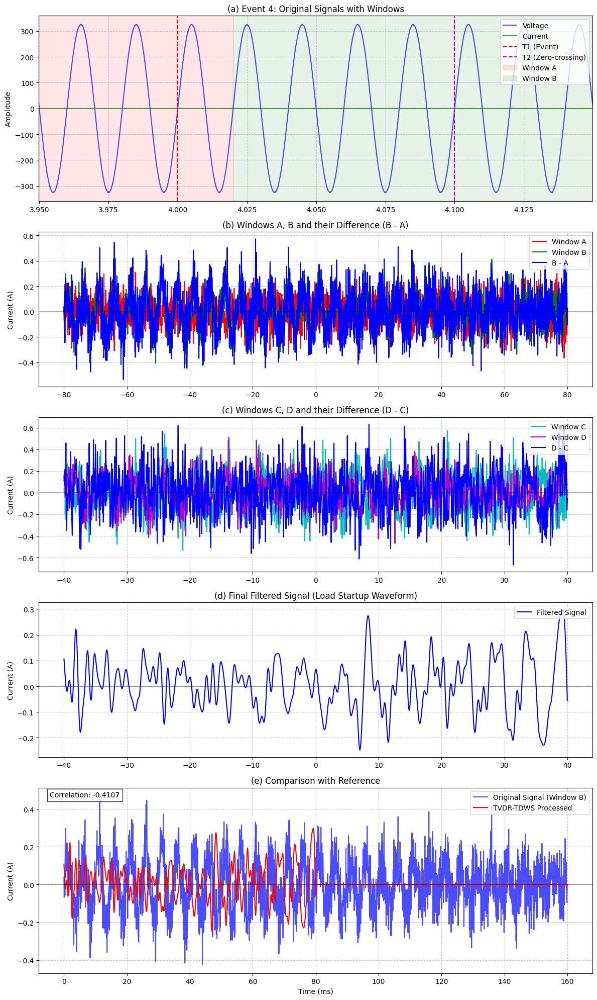

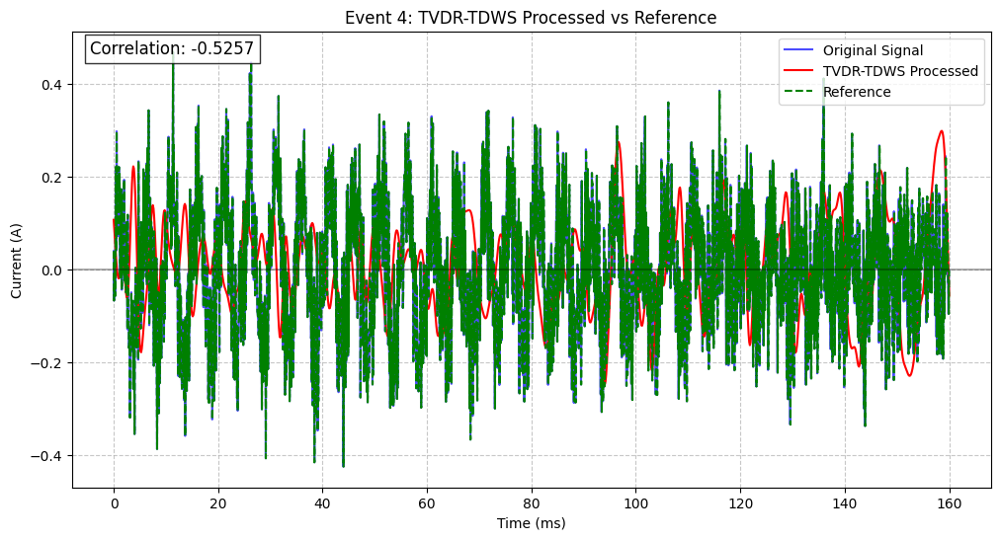

Processing events:  80%|████████  | 4/5 [00:50<00:12, 12.81s/it]


Plotting event 5...


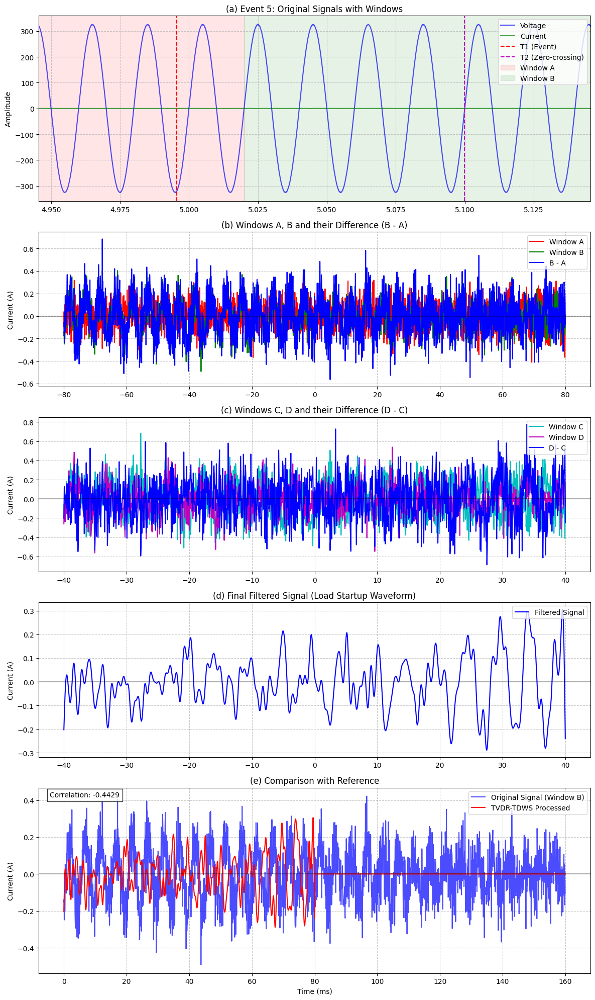

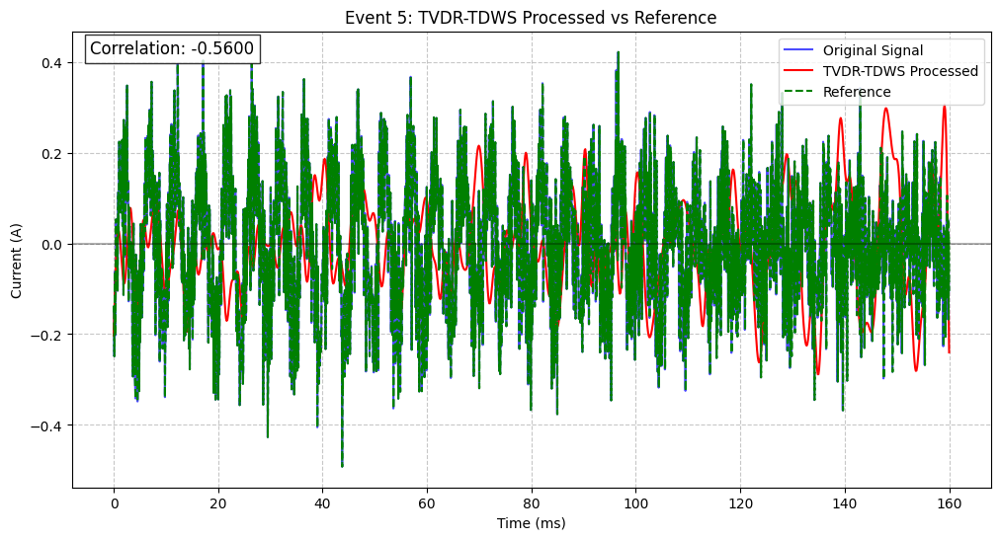

Processing events: 100%|██████████| 5/5 [00:56<00:00, 11.33s/it]



PROCESSING SUMMARY

 Event   T1 (s)   T2 (s) T2-T1 (ms) RMS A (A) RMS B (A) RMS B-A (A) RMS D-C (A) RMS Filtered (A)
     1 1.003375 1.120003     116.63    0.1090    0.1343      0.1679      0.2290           0.1289
     2 1.998063 2.100008     101.95    0.1043    0.1370      0.1689      0.2189           0.1131
     3 2.995375 3.099997     104.62    0.1049    0.1352      0.1681      0.2124           0.0987
     4 3.999812 4.099992     100.18    0.1034    0.1372      0.1694      0.2099           0.0997
     5 4.995563 5.099995     104.43    0.1053    0.1403      0.1764      0.2262           0.1080

Results saved to: results\tvdr_tdws_summary_20251005_110538.csv

TVDR-TDWS processing completed!
TVDR-TDWS Implementation with NILMTK Integration
Appliance: kettle
Sampling Rate: 16.0kHz
Voltage: 325V peak (229.8V RMS)
Window Size: 8 cycles (160ms)
Using simulated data...
Generating simulated data...
Generated 160000 samples of simulated data

Generating overview of all detected events...


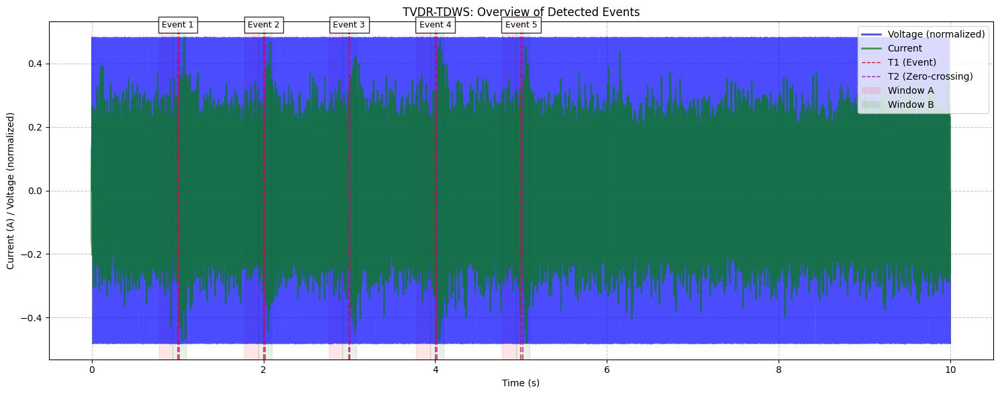


Processing 5 events...


Processing events:   0%|          | 0/5 [00:00<?, ?it/s]


Plotting event 1...


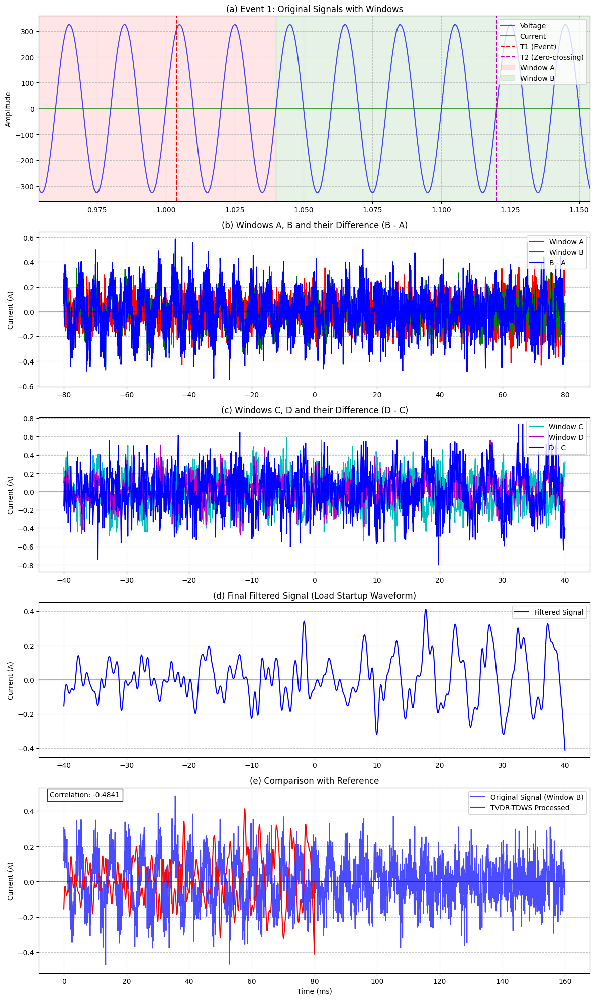

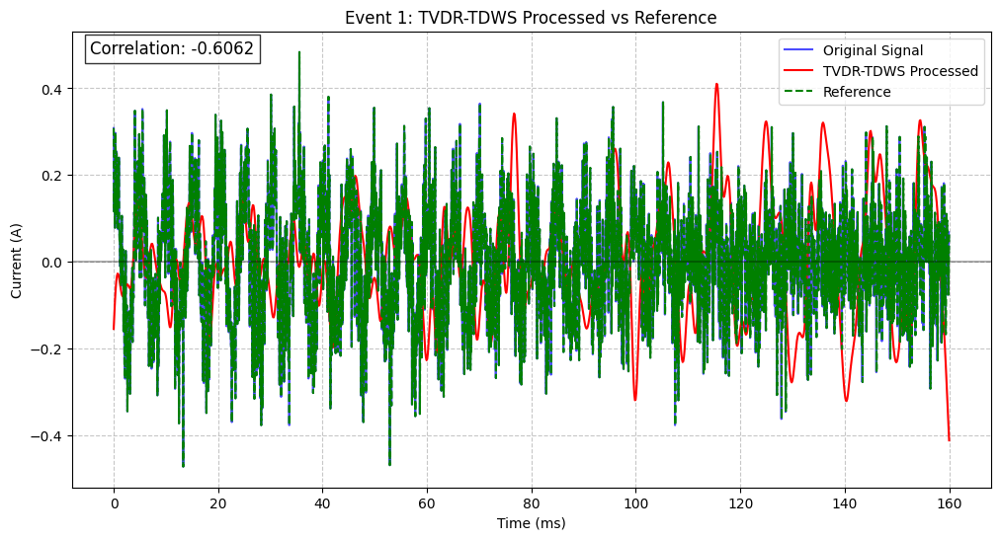

Processing events:  20%|██        | 1/5 [00:05<00:22,  5.62s/it]


Plotting event 2...


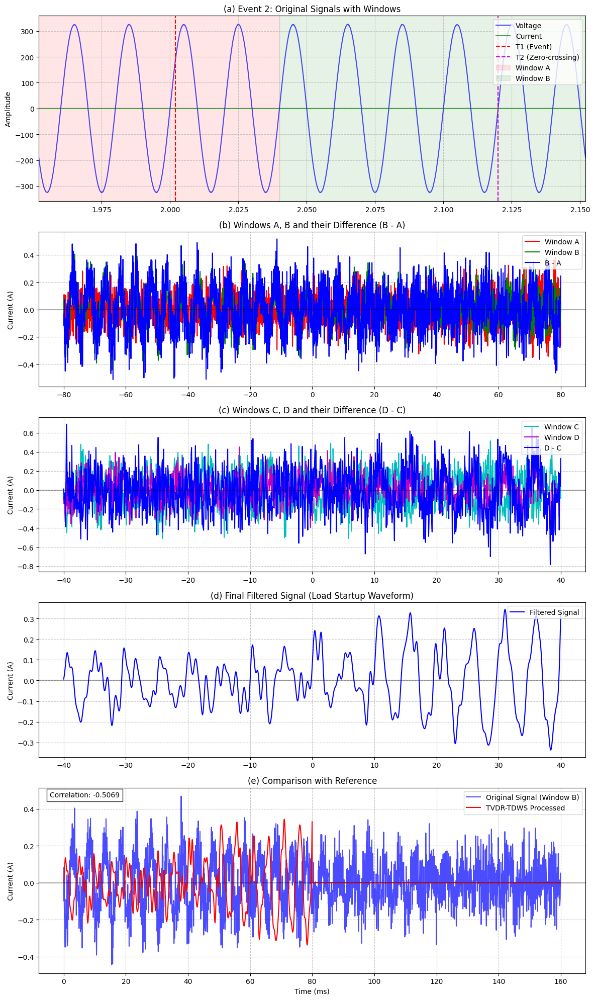

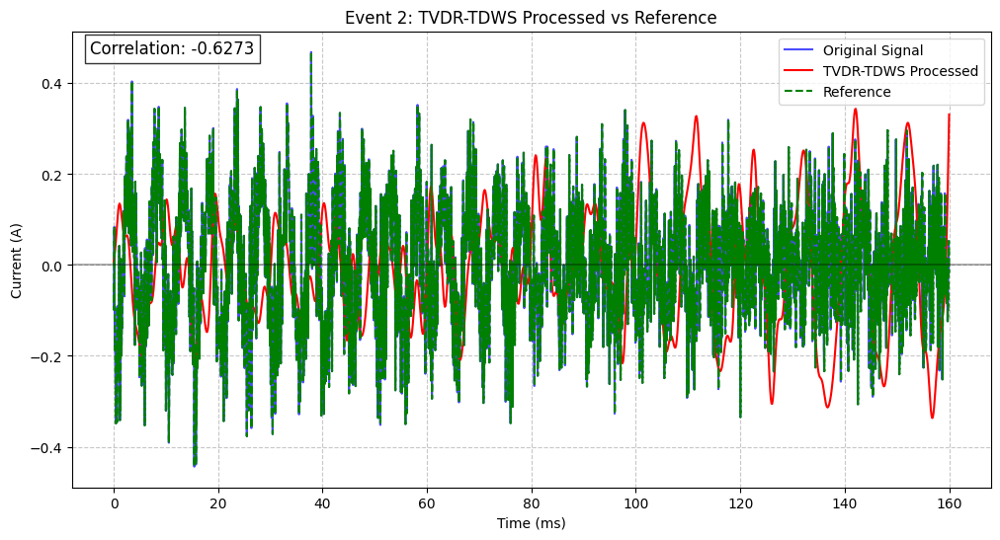

Processing events:  40%|████      | 2/5 [00:11<00:16,  5.50s/it]


Plotting event 3...


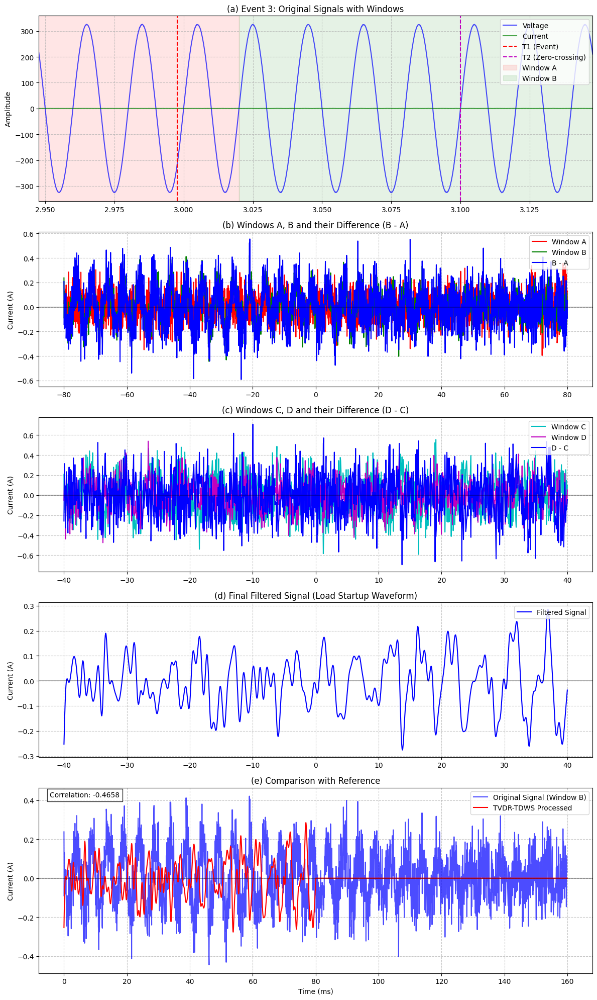

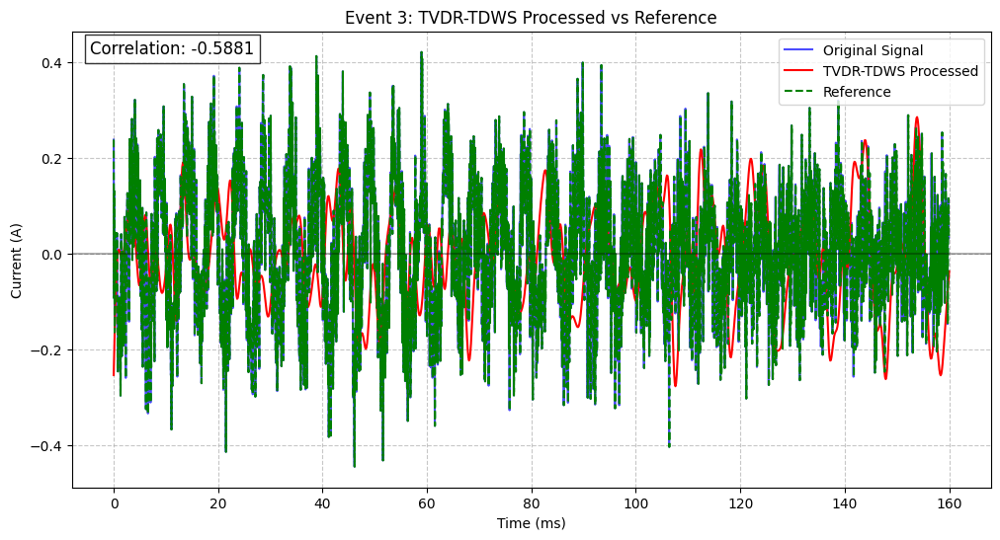

Processing events:  60%|██████    | 3/5 [00:16<00:10,  5.49s/it]


Plotting event 4...


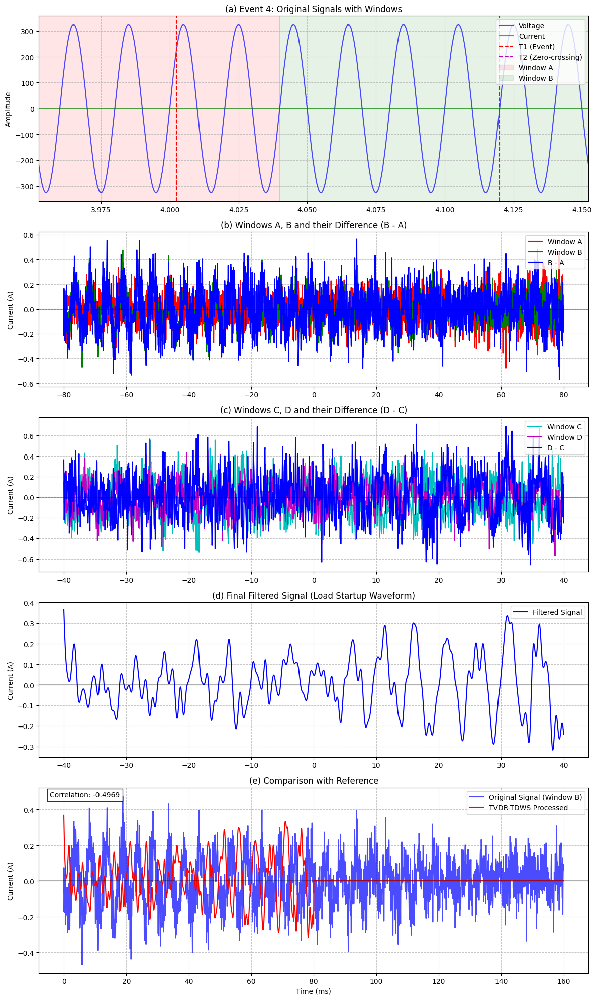

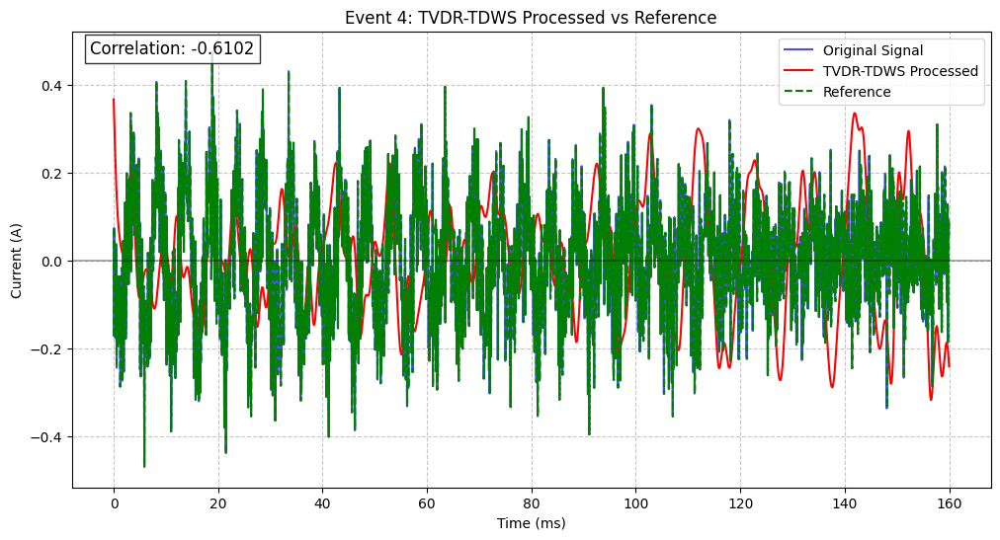

Processing events:  80%|████████  | 4/5 [00:22<00:05,  5.76s/it]


Plotting event 5...


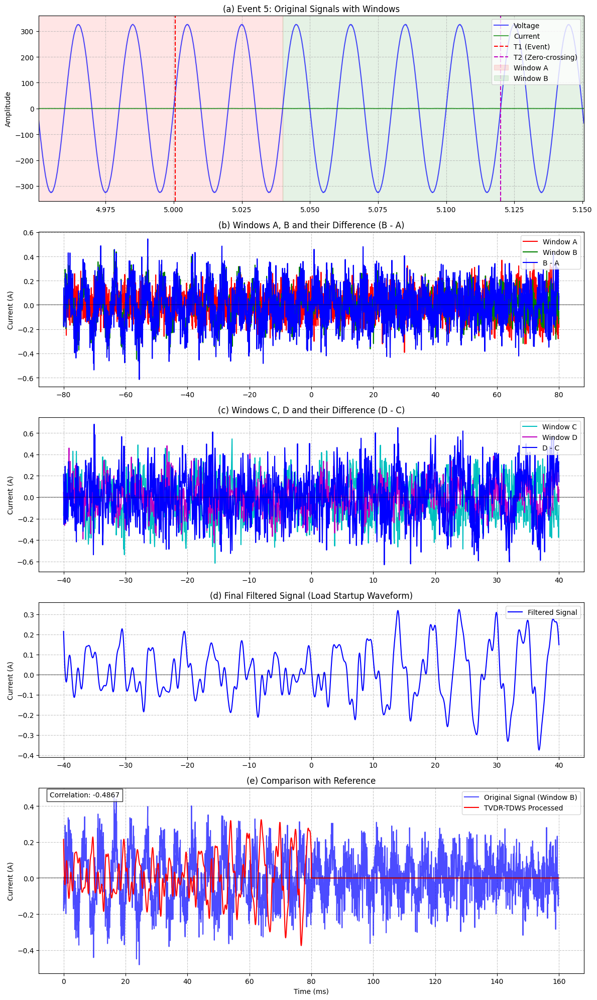

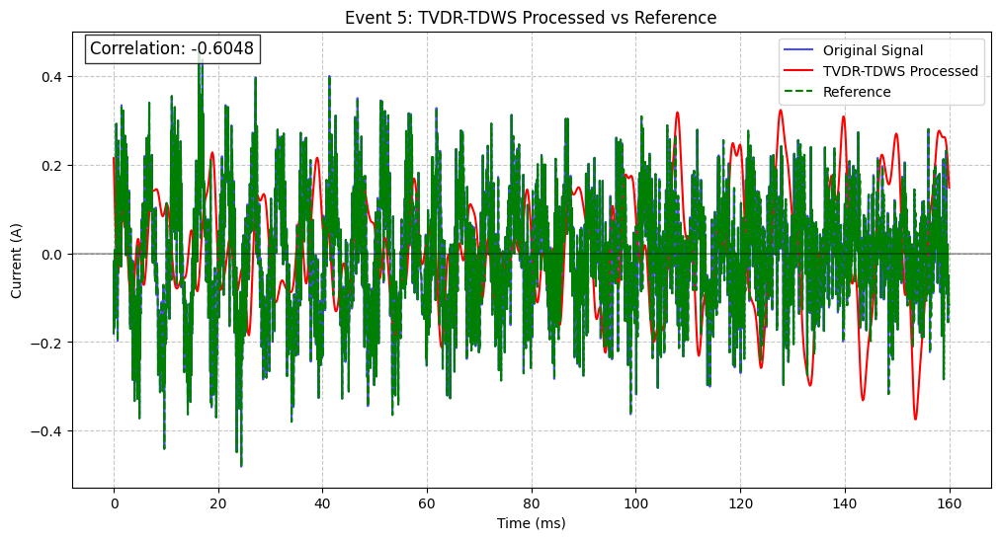

Processing events: 100%|██████████| 5/5 [00:28<00:00,  5.79s/it]


PROCESSING SUMMARY

 Event   T1 (s)   T2 (s) T2-T1 (ms) RMS A (A) RMS B (A) RMS B-A (A) RMS D-C (A) RMS Filtered (A)
     1 1.003937 1.119997     116.06    0.1116    0.1333      0.1732      0.2382           0.1348
     2 2.002000 2.120005     118.00    0.1067    0.1350      0.1683      0.2326           0.1366
     3 2.997688 3.100001     102.31    0.1038    0.1392      0.1708      0.2155           0.1046
     4 4.002375 4.119998     117.62    0.1102    0.1341      0.1709      0.2277           0.1331
     5 5.000500 5.120008     119.51    0.1080    0.1357      0.1693      0.2272           0.1318

Results saved to: results\tvdr_tdws_summary_20251005_110625.csv

TVDR-TDWS processing completed!


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import signal
from nilmtk import DataSet
from nilmtk.utils import get_datastore
import os
from datetime import datetime
from tqdm import tqdm
from matplotlib.gridspec import GridSpec

# ===========================================
# CONFIGURATION
# ===========================================
config = {
    # Data source
    'dataset_path': r"C:\Users\Raymond Tie\Desktop\NILM\datasets\ukdale.h5",
    'building': 1,
    'appliance': "kettle",
    
    # Signal parameters (from paper)
    'sampling_rate': 16000,    # 16kHz for UK-DALE
    'voltage_freq': 50,        # 50Hz grid
    'voltage_peak': 325,       # 230V RMS → 325V peak
    'window_cycles': 8,        # 8 voltage cycles per window
    'lpf_cutoff': 1000,        # 1kHz low-pass filter
    
    # Activation detection
    'on_power_threshold': 50,  # Power threshold for activation detection (W)
    'min_off_duration': 60,    # Minimum OFF duration (s)
    'min_on_duration': 60,     # Minimum ON duration (s)
    
    # Processing
    'start_time': "2013-11-08 00:00:00",
    'end_time': "2013-11-08 23:59:00",
    'max_events': 5,           # Maximum events to process
    'simulate_data': False,    # Set to True for testing
    'output_dir': 'results'    # Directory to save results
}

# Create output directory
os.makedirs(config['output_dir'], exist_ok=True)

# ===========================================
# CORE TVDR-TDWS ALGORITHM
# ===========================================
def find_zero_crossings(voltage_signal):
    """Find all negative-to-positive zero-crossings with interpolation for precision."""
    crossings = np.where((voltage_signal[:-1] <= 0) & (voltage_signal[1:] > 0))[0]
    precise_crossings = []
    for i in crossings:
        x = [i, i+1]
        y = [voltage_signal[i], voltage_signal[i+1]]
        if y[0] != y[1]:  # Avoid division by zero
            t = np.interp(0, y, x)
            precise_crossings.append(t)
        else:
            precise_crossings.append(i + 0.5)  # If exactly equal, take midpoint
    return np.array(precise_crossings)

def get_window(signal_data, center_idx, window_size):
    """Extract a window of data centered around an index with bounds checking."""
    half = int(window_size // 2)
    start = max(0, int(center_idx - half))
    end = min(len(signal_data), int(center_idx + half))
    return signal_data[start:end], start, end

def process_tvdr_tdws(voltage, current, event_idx, sampling_rate, voltage_freq, window_cycles, lpf_cutoff):
    """Process a single event using TVDR-TDWS method with precise window alignment."""
    t1_idx = event_idx
    
    # Find next voltage zero-crossing (T2)
    zero_crossings = find_zero_crossings(voltage)
    if len(zero_crossings) == 0:
        return None
    
    margin = int(0.1 * sampling_rate)  # 100ms margin
    zc_after_t1 = zero_crossings[zero_crossings > (t1_idx + margin)]
    if len(zc_after_t1) == 0:
        return None
    t2_idx = zc_after_t1[0]
    
    # Calculate window size in samples
    samples_per_cycle = int(sampling_rate / voltage_freq)
    window_size = window_cycles * samples_per_cycle
    half_window = window_size // 2
    
    # Define Window B (centered at T2)
    window_b, b_start, b_end = get_window(current, t2_idx, window_size)
    
    # Define Window A (N cycles before Window B)
    a_center = t2_idx - window_size
    window_a, a_start, a_end = get_window(current, a_center, window_size)
    
    # Ensure windows have exactly the same size
    min_len = min(len(window_a), len(window_b))
    if min_len < window_size // 2:  # Skip if window is too small
        return None
    
    window_a = window_a[:min_len]
    window_b = window_b[:min_len]
    
    # First subtraction (B - A)
    diff_ba = window_b - window_a
    
    # Subdivide into windows C and D (N/2 cycles each)
    split_point = len(diff_ba) // 2
    window_c = diff_ba[:split_point]
    window_d = diff_ba[split_point:2*split_point]
    
    # Ensure windows are of equal length
    min_len = min(len(window_c), len(window_d))
    window_c = window_c[:min_len]
    window_d = window_d[:min_len]
    
    # Second subtraction (D - C)
    diff_dc = window_d - window_c
    
    # Apply low-pass filter
    nyquist = 0.5 * sampling_rate
    normal_cutoff = lpf_cutoff / nyquist
    b, a = signal.butter(4, normal_cutoff, btype='low')
    filtered_signal = signal.filtfilt(b, a, diff_dc)
    
    # Create time vectors in milliseconds
    time_ms = lambda x: np.linspace(-len(x)//2, len(x)//2, len(x)) * 1000 / sampling_rate
    
    return {
        't1_idx': t1_idx,
        't2_idx': t2_idx,
        'windows': {
            'A': window_a, 'B': window_b, 
            'C': window_c, 'D': window_d,
            'diff_ba': diff_ba,
            'diff_dc': diff_dc,
            'filtered': filtered_signal
        },
        'time_vectors': {
            'ba': time_ms(diff_ba),
            'cd': time_ms(window_c),
            'filtered': time_ms(filtered_signal)
        },
        'indices': {
            'A': (a_start, a_start + len(window_a)),
            'B': (b_start, b_start + len(window_b))
        }
    }

# ===========================================
# ACTIVATION DETECTION
# ===========================================
def detect_activations(appliance, sampling_rate, **kwargs):
    """Detect activations using NILMTK's built-in method and convert to sample indices."""
    params = {
        'on_power_threshold': 50,
        'min_off_duration': 60,
        'min_on_duration': 60
    }
    params.update(kwargs)
    
    power_series = next(appliance.power_series(sample_period=6))
    power_data = pd.Series(power_series, index=power_series.index)
    activations = appliance.get_activations(**params)
    
    activation_indices = []
    for act in activations:
        start_time = act.index[0]
        time_diff = (power_data.index - start_time).total_seconds().abs()
        closest_idx = np.argmin(time_diff)
        hf_idx = int(closest_idx * (sampling_rate / 6))  # Convert from 6s to high-freq
        activation_indices.append(hf_idx)
    
    return activation_indices, power_data

# ===========================================
# VISUALIZATION
# ===========================================
def plot_comparison(original_signal, processed_signal, reference_signal, sampling_rate, 
                   title="Comparison of Signals", save_path=None):
    """Plot comparison between original, processed, and reference signals."""
    plt.figure(figsize=(12, 6))
    
    # Create time vectors in milliseconds
    t_original = np.arange(len(original_signal)) * 1000 / sampling_rate
    t_processed = np.linspace(0, len(original_signal)*1000/sampling_rate, len(processed_signal))
    t_reference = np.linspace(0, len(original_signal)*1000/sampling_rate, len(reference_signal))
    
    # Plot signals
    plt.plot(t_original, original_signal, 'b-', alpha=0.7, label='Original Signal')
    plt.plot(t_processed, processed_signal, 'r-', linewidth=1.5, label='TVDR-TDWS Processed')
    plt.plot(t_reference, reference_signal, 'g--', linewidth=1.5, label='Reference')
    
    # Calculate and display correlation
    min_len = min(len(processed_signal), len(reference_signal))
    if min_len > 0:
        corr = np.corrcoef(processed_signal[:min_len], reference_signal[:min_len])[0, 1]
        plt.text(0.02, 0.95, f'Correlation: {corr:.4f}', 
                transform=plt.gca().transAxes, fontsize=12,
                bbox=dict(facecolor='white', alpha=0.8))
    
    # Add labels and title
    plt.xlabel('Time (ms)')
    plt.ylabel('Current (A)')
    plt.title(title)
    plt.legend(loc='upper right')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.axhline(0, color='k', linestyle='-', alpha=0.3)
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()

def plot_processing_steps(voltage, current, result, event_num=1, save_path=None):
    """Plot detailed processing steps for a single event."""
    fig = plt.figure(figsize=(12, 20))
    gs = GridSpec(5, 1, height_ratios=[1.2, 1, 1, 1, 1.2])
    
    # Time vectors
    fs = config['sampling_rate']
    t_full = np.arange(len(voltage)) / fs
    t1 = result['t1_idx'] / fs
    t2 = result['t2_idx'] / fs
    
    # Plot 1: Original signals with windows
    ax1 = fig.add_subplot(gs[0])
    ax1.plot(t_full, voltage, 'b-', alpha=0.7, label='Voltage')
    ax1.plot(t_full, current, 'g-', alpha=0.7, label='Current')
    ax1.axvline(t1, color='r', linestyle='--', label='T1 (Event)')
    ax1.axvline(t2, color='m', linestyle='--', label='T2 (Zero-crossing)')
    
    # Shade windows A and B
    a_start, a_end = result['indices']['A']
    b_start, b_end = result['indices']['B']
    ax1.axvspan(a_start/fs, a_end/fs, color='red', alpha=0.1, label='Window A')
    ax1.axvspan(b_start/fs, b_end/fs, color='green', alpha=0.1, label='Window B')
    
    # Formatting
    ax1.set_xlim(t1 - 0.05, t1 + 0.15)
    ax1.set_ylabel('Amplitude')
    ax1.set_title(f'(a) Event {event_num}: Original Signals with Windows')
    ax1.legend(loc='upper right')
    ax1.grid(True, linestyle='--', alpha=0.7)
    
    # Plot 2: Windows A, B and B-A
    ax2 = fig.add_subplot(gs[1])
    ax2.plot(result['time_vectors']['ba'], result['windows']['A'], 'r-', label='Window A')
    ax2.plot(result['time_vectors']['ba'], result['windows']['B'], 'g-', label='Window B')
    ax2.plot(result['time_vectors']['ba'], result['windows']['diff_ba'], 'b-', 
             label='B - A', linewidth=1.5)
    ax2.axhline(0, color='k', linestyle='-', alpha=0.3)
    ax2.set_ylabel('Current (A)')
    ax2.set_title('(b) Windows A, B and their Difference (B - A)')
    ax2.legend(loc='upper right')
    ax2.grid(True, linestyle='--', alpha=0.7)
    
    # Plot 3: Windows C, D and D-C
    ax3 = fig.add_subplot(gs[2])
    ax3.plot(result['time_vectors']['cd'], result['windows']['C'], 'c-', label='Window C')
    ax3.plot(result['time_vectors']['cd'], result['windows']['D'], 'm-', label='Window D')
    ax3.plot(result['time_vectors']['cd'], result['windows']['diff_dc'], 'b-', 
             label='D - C', linewidth=1.5)
    ax3.axhline(0, color='k', linestyle='-', alpha=0.3)
    ax3.set_ylabel('Current (A)')
    ax3.set_title('(c) Windows C, D and their Difference (D - C)')
    ax3.legend(loc='upper right')
    ax3.grid(True, linestyle='--', alpha=0.7)
    
    # Plot 4: Filtered signal
    ax4 = fig.add_subplot(gs[3])
    ax4.plot(result['time_vectors']['filtered'], 
             result['windows']['filtered'], 
             'b-', label='Filtered Signal')
    ax4.axhline(0, color='k', linestyle='-', alpha=0.3)
    ax4.set_ylabel('Current (A)')
    ax4.set_title('(d) Final Filtered Signal (Load Startup Waveform)')
    ax4.legend(loc='upper right')
    ax4.grid(True, linestyle='--', alpha=0.7)
    
    # Plot 5: Comparison with reference
    ax5 = fig.add_subplot(gs[4])
    reference_signal = result['windows']['B']  # Using Window B as reference
    processed_signal = np.pad(result['windows']['filtered'], 
                            (0, len(reference_signal) - len(result['windows']['filtered'])), 
                            'constant')
    
    t_original = np.arange(len(reference_signal)) * 1000 / fs
    t_processed = np.linspace(0, len(reference_signal)*1000/fs, len(processed_signal))
    
    ax5.plot(t_original, reference_signal, 'b-', alpha=0.7, label='Original Signal (Window B)')
    ax5.plot(t_processed, processed_signal, 'r-', linewidth=1.5, label='TVDR-TDWS Processed')
    
    # Calculate and display correlation
    min_len = min(len(processed_signal), len(reference_signal))
    if min_len > 0:
        corr = np.corrcoef(processed_signal[:min_len], reference_signal[:min_len])[0, 1]
        ax5.text(0.02, 0.95, f'Correlation: {corr:.4f}', 
                transform=ax5.transAxes, fontsize=10,
                bbox=dict(facecolor='white', alpha=0.8))
    
    ax5.set_xlabel('Time (ms)')
    ax5.set_ylabel('Current (A)')
    ax5.set_title('(e) Comparison with Reference')
    ax5.legend(loc='upper right')
    ax5.grid(True, linestyle='--', alpha=0.7)
    ax5.axhline(0, color='k', linestyle='-', alpha=0.3)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()

# [Rest of your existing code...]

def main():
    print("TVDR-TDWS Implementation with NILMTK Integration")
    print("=" * 70)
    print(f"Appliance: {config['appliance']}")
    print(f"Sampling Rate: {config['sampling_rate']/1000}kHz")
    print(f"Voltage: {config['voltage_peak']}V peak ({config['voltage_peak']/np.sqrt(2):.1f}V RMS)")
    print(f"Window Size: {config['window_cycles']} cycles ({config['window_cycles']/config['voltage_freq']*1000:.0f}ms)")
    print("=" * 70)
    
    # Load or generate data
    if not config['simulate_data']:
        try:
            print("\nLoading dataset...")
            dataset = DataSet(config['dataset_path'])
            dataset.set_window(start=config['start_time'], end=config['end_time'])
            elec = dataset.buildings[config['building']].elec
            appliance = elec[config['appliance']]
            
            # Detect activations using NILMTK's method
            print("Detecting activation events...")
            activation_indices, power_data = detect_activations(
                appliance,
                sampling_rate=config['sampling_rate'],
                on_power_threshold=config['on_power_threshold'],
                min_off_duration=config['min_off_duration'],
                min_on_duration=config['min_on_duration']
            )
            
            # Load high-frequency data
            print("Loading high-frequency data...")
            voltage_data = next(elec.mains().voltage().load(sample_period=1/config['sampling_rate']))
            voltage = pd.Series(voltage_data.values.flatten(), index=voltage_data.index)
            
            current_data = next(elec.mains().current().load(sample_period=1/config['sampling_rate']))
            current = pd.Series(current_data.values.flatten(), index=current_data.index)
            
        except Exception as e:
            print(f"Error loading data: {e}")
            print("Falling back to simulated data...")
            config['simulate_data'] = True
    
    if config['simulate_data']:
        print("Using simulated data...")
        from datetime import datetime
        voltage, current, power_data, activation_indices = generate_simulated_data(
            duration=10,
            sampling_rate=config['sampling_rate'],
            voltage_freq=config['voltage_freq'],
            voltage_peak=config['voltage_peak']
        )
    
    # Convert to numpy arrays for processing
    voltage_values = voltage.values
    current_values = current.values
    
    # Limit number of events to process
    max_events = min(len(activation_indices), config['max_events'])
    activation_indices = activation_indices[:max_events]
    
    if not activation_indices:
        print("No activation events found. Please check your parameters.")
        return
    
    # Show overview of all events
    print("\nGenerating overview of all detected events...")
    plot_overview(
        voltage_values, current_values,
        activation_indices,
        config['sampling_rate'],
        config['window_cycles'],
        config['voltage_freq'],
        save_path=os.path.join(config['output_dir'], 'overview_plot.png')
    )
    
    # Process each event
    print(f"\nProcessing {len(activation_indices)} events...")
    processed_events = []
    
    for i, idx in enumerate(tqdm(activation_indices, desc="Processing events")):
        # Ensure we have enough data after the event
        if idx + 2 * config['sampling_rate'] > len(voltage_values):
            print(f"\nNot enough data after event {i+1}, skipping...")
            continue
            
        # Process using TVDR-TDWS
        result = process_tvdr_tdws(
            voltage_values, current_values, idx,
            config['sampling_rate'],
            config['voltage_freq'],
            config['window_cycles'],
            config['lpf_cutoff']
        )
        
        if result:
            processed_events.append(result)
            print(f"\nPlotting event {i+1}...")
            plot_processing_steps(
                voltage_values, current_values, result, i+1,
                save_path=os.path.join(config['output_dir'], f'event_{i+1}_processing.png')
            )
            
            # Generate comparison plot
            reference = result['windows']['B']  # Using Window B as reference
            processed = result['windows']['filtered']
            plot_comparison(
                reference,
                processed,
                reference,  # Using same as reference for demonstration
                config['sampling_rate'],
                title=f"Event {i+1}: TVDR-TDWS Processed vs Reference",
                save_path=os.path.join(config['output_dir'], f'event_{i+1}_comparison.png')
            )
    
    # Generate summary
    if processed_events:
        print("\n" + "="*100)
        print("PROCESSING SUMMARY")
        print("="*100)
        
        summary = []
        for i, event in enumerate(processed_events, 1):
            t1 = event['t1_idx'] / config['sampling_rate']
            t2 = event['t2_idx'] / config['sampling_rate']
            t_diff = (t2 - t1) * 1000  # in ms
            
            # Calculate RMS values
            rms = lambda x: np.sqrt(np.mean(np.square(x)))
            
            summary.append({
                'Event': i,
                'T1 (s)': f"{t1:.6f}",
                'T2 (s)': f"{t2:.6f}",
                'T2-T1 (ms)': f"{t_diff:.2f}",
                'RMS A (A)': f"{rms(event['windows']['A']):.4f}",
                'RMS B (A)': f"{rms(event['windows']['B']):.4f}",
                'RMS B-A (A)': f"{rms(event['windows']['diff_ba']):.4f}",
                'RMS D-C (A)': f"{rms(event['windows']['diff_dc']):.4f}",
                'RMS Filtered (A)': f"{rms(event['windows']['filtered']):.4f}"
            })
        
        # Display summary
        pd.set_option('display.max_columns', None)
        pd.set_option('display.width', 120)
        summary_df = pd.DataFrame(summary)
        print("\n" + summary_df.to_string(index=False))
        
        # Save results
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        results_file = os.path.join(config['output_dir'], f'tvdr_tdws_summary_{timestamp}.csv')
        summary_df.to_csv(results_file, index=False)
        print(f"\nResults saved to: {results_file}")
    
    print("\nTVDR-TDWS processing completed!")

if __name__ == "__main__":
    main()